In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

%config InlineBackend.figure_format = 'retina'

In [2]:
RANDOM_SEED = 666

In [3]:
pd.set_option("display.max_columns", None)

# Airline Passenger Satisfaction

From last week, we can look at the dataset corresponding to predicting whether passengers were satisfied with the airline. We read in both a training and test set.

In [4]:
train = pd.read_csv("../../4/data/airline_satisfaction/train.csv", index_col=0)
train.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


In [5]:
test = pd.read_csv("../../4/data/airline_satisfaction/test.csv", index_col=0)
test.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,19556,Female,Loyal Customer,52,Business travel,Eco,160,5,4,3,4,3,4,3,5,5,5,5,2,5,5,50,44.0,satisfied
1,90035,Female,Loyal Customer,36,Business travel,Business,2863,1,1,3,1,5,4,5,4,4,4,4,3,4,5,0,0.0,satisfied
2,12360,Male,disloyal Customer,20,Business travel,Eco,192,2,0,2,4,2,2,2,2,4,1,3,2,2,2,0,0.0,neutral or dissatisfied
3,77959,Male,Loyal Customer,44,Business travel,Business,3377,0,0,0,2,3,4,4,1,1,1,1,3,1,4,0,6.0,satisfied
4,36875,Female,Loyal Customer,49,Business travel,Eco,1182,2,3,4,3,4,1,2,2,2,2,2,4,2,4,0,20.0,satisfied


## Linear Model

To start, we train a logistic regression model using only numerical features.

In [6]:
# Train a simple model using only numerical features
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [7]:
ignore_features = ["id"]
features = [
    column
    for column, series in train.items()
    if np.issubdtype(series.dtype, np.number) and column not in ignore_features
]
target = "satisfaction"

In [8]:
X_train = train[features]

label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(train[target])

In [9]:
X_test = test[features]
y_test = label_encoder.transform(test[target])

In [10]:
pipeline = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("imputer", SimpleImputer()),
        ("estimator", LogisticRegression(random_state=RANDOM_SEED)),
    ]
)

In [11]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('imputer', SimpleImputer()),
                ('estimator', LogisticRegression(random_state=666))])

In [12]:
y_train_pred = pipeline.predict(X_train)

In [13]:
y_test_pred = pipeline.predict(X_test)

Let's look at the classification report

In [14]:
from sklearn.metrics import classification_report

print("Training")
print(classification_report(y_train, y_train_pred))
print("Test")
print(classification_report(y_test, y_test_pred))

Training
              precision    recall  f1-score   support

           0       0.84      0.87      0.85     58879
           1       0.82      0.78      0.80     45025

    accuracy                           0.83    103904
   macro avg       0.83      0.82      0.82    103904
weighted avg       0.83      0.83      0.83    103904

Test
              precision    recall  f1-score   support

           0       0.83      0.86      0.85     14573
           1       0.82      0.78      0.80     11403

    accuracy                           0.83     25976
   macro avg       0.82      0.82      0.82     25976
weighted avg       0.83      0.83      0.83     25976



Model has decent performance, no real signs of overfitting.

### Random Forest

Now, let's try out a random forest on the data using the default hyperparameters.

In [15]:
from sklearn.ensemble import RandomForestClassifier

In [16]:
pipeline = Pipeline(
    [
        ("imputer", SimpleImputer()),
        # NOTE: We do not have to scale our data
        ("estimator", RandomForestClassifier(random_state=RANDOM_SEED)),
    ]
)

In [17]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('imputer', SimpleImputer()),
                ('estimator', RandomForestClassifier(random_state=666))])

In [18]:
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

In [19]:
print("Training")
print(classification_report(y_train, y_train_pred))
print("Test")
print(classification_report(y_test, y_test_pred))

Training
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     58879
           1       1.00      1.00      1.00     45025

    accuracy                           1.00    103904
   macro avg       1.00      1.00      1.00    103904
weighted avg       1.00      1.00      1.00    103904

Test
              precision    recall  f1-score   support

           0       0.94      0.97      0.95     14573
           1       0.96      0.92      0.94     11403

    accuracy                           0.95     25976
   macro avg       0.95      0.95      0.95     25976
weighted avg       0.95      0.95      0.95     25976



Wow! It's definitely overfit to the training data, but it performs quite well on the test data. Let's see what's going on inside

In [20]:
model = pipeline.named_steps["estimator"]
model

RandomForestClassifier(random_state=666)

In [21]:
print("Model (hyper)parameters")
print(f"{'n_estimators':25s} = {model.n_estimators}")
for param in model.estimator_params:
    print(f"{param:25s} = {getattr(model, param)}")

Model (hyper)parameters
n_estimators              = 100
criterion                 = gini
max_depth                 = None
min_samples_split         = 2
min_samples_leaf          = 1
min_weight_fraction_leaf  = 0.0
max_features              = sqrt
max_leaf_nodes            = None
min_impurity_decrease     = 0.0
random_state              = 666
ccp_alpha                 = 0.0


The random forest is made up of 100 individual decision trees. Here's the first one:

In [22]:
model.estimators_[0]

DecisionTreeClassifier(max_features='sqrt', random_state=860870892)

And here are some details about that tree

In [23]:
tree = model.estimators_[0]

In [24]:
for param in ("max_depth", "n_leaves", "node_count"):
    print(f"{param:25s} = {getattr(tree.tree_, param):,}")

max_depth                 = 35
n_leaves                  = 6,823
node_count                = 13,645


Lastly, let's see what it looks like:

In [25]:
import graphviz
from sklearn.tree import export_graphviz

dot_data = export_graphviz(
    tree,
    out_file=None,
    feature_names=features,
    impurity=False,
    class_names=label_encoder.classes_,
)
graph = graphviz.Source(dot_data)
graph

### Grid Search

Was this the best model we could have produced? Let's try running a cross validation grid search over some key hyperparameters. This might take a little bit to run!

In [27]:
from sklearn.model_selection import GridSearchCV

In [28]:
param_grid = {
    "estimator__n_estimators": [5, 10, 100, 200, 500],
    "estimator__max_depth": [2, 10, 25, None],
}
pipeline = Pipeline(
    [
        ("imputer", SimpleImputer()),
        ("estimator", RandomForestClassifier(random_state=RANDOM_SEED)),
    ]
)
grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=5,
    scoring="f1",
    n_jobs=-1,
    return_train_score=True,
    refit=True,
)

In [29]:
grid_search.fit(X_train, y_train)

/Users/erosenthal/.pyenv/versions/week5/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('imputer', SimpleImputer()),
                                       ('estimator',
                                        RandomForestClassifier(random_state=666))]),
             n_jobs=-1,
             param_grid={'estimator__max_depth': [2, 10, 25, None],
                         'estimator__n_estimators': [5, 10, 100, 200, 500]},
             return_train_score=True, scoring='f1')

In [30]:
results = pd.DataFrame(grid_search.cv_results_)
results["param_estimator__max_depth"] = results["param_estimator__max_depth"].apply(
    lambda x: f"{x:02d}" if x is not None else "none"
)

Let's investigate the results by looking at the average _training_ F1 score across all cross validation folds as a function of the two hyperparameters.

In [31]:
print("Grid Search Results for Training F1 Score")
(
    pd.pivot_table(
        results,
        index="param_estimator__n_estimators",
        columns="param_estimator__max_depth",
        values="mean_train_score",
    ).style.background_gradient(cmap="summer", axis=None)
)

Grid Search Results for Training F1 Score


param_estimator__max_depth,02,10,25,none
param_estimator__n_estimators,,,,
5,0.803222,0.922730,0.989765,0.991588
10,0.801043,0.927612,0.995020,0.995777
100,0.803045,0.928381,0.999050,0.999969
200,0.798802,0.928719,0.999130,1.000000
500,0.800253,0.929274,0.999250,1.000000


It looks like the `max_depth` is more important than `n_esimtators`, but it's still important that both have high values for good performance on the training data. 

Now, let's look at the average _validation_ F1 score.

In [32]:
print("Grid Search Results for Validation F1 Score")

(
    pd.pivot_table(
        results,
        index="param_estimator__n_estimators",
        columns="param_estimator__max_depth",
        values="mean_test_score",
    ).style.background_gradient(cmap="summer", axis=None)
)

Grid Search Results for Validation F1 Score


param_estimator__max_depth,02,10,25,none
param_estimator__n_estimators,,,,
5,0.802981,0.913587,0.925996,0.924381
10,0.801073,0.918470,0.930454,0.930459
100,0.802880,0.919680,0.938750,0.938819
200,0.798911,0.920318,0.939223,0.939206
500,0.800137,0.920596,0.939052,0.939360


It seems that we likely aren't fully overfitting -- both training and test F1 scores continued to increase with increasing hyperparameter values.

If we again run the classification report on the full training and the final test set, we actually see that model performance hasn't changed from the original model. I guess we had a pretty optimal model all along!

In [33]:
y_train_pred = grid_search.predict(X_train)
y_test_pred = grid_search.predict(X_test)

In [34]:
print("Training")
print(classification_report(y_train, y_train_pred))
print("Test")
print(classification_report(y_test, y_test_pred))

Training
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     58879
           1       1.00      1.00      1.00     45025

    accuracy                           1.00    103904
   macro avg       1.00      1.00      1.00    103904
weighted avg       1.00      1.00      1.00    103904

Test
              precision    recall  f1-score   support

           0       0.94      0.97      0.96     14573
           1       0.96      0.92      0.94     11403

    accuracy                           0.95     25976
   macro avg       0.95      0.95      0.95     25976
weighted avg       0.95      0.95      0.95     25976



Lastly, we can inspect the best models' feature importances:

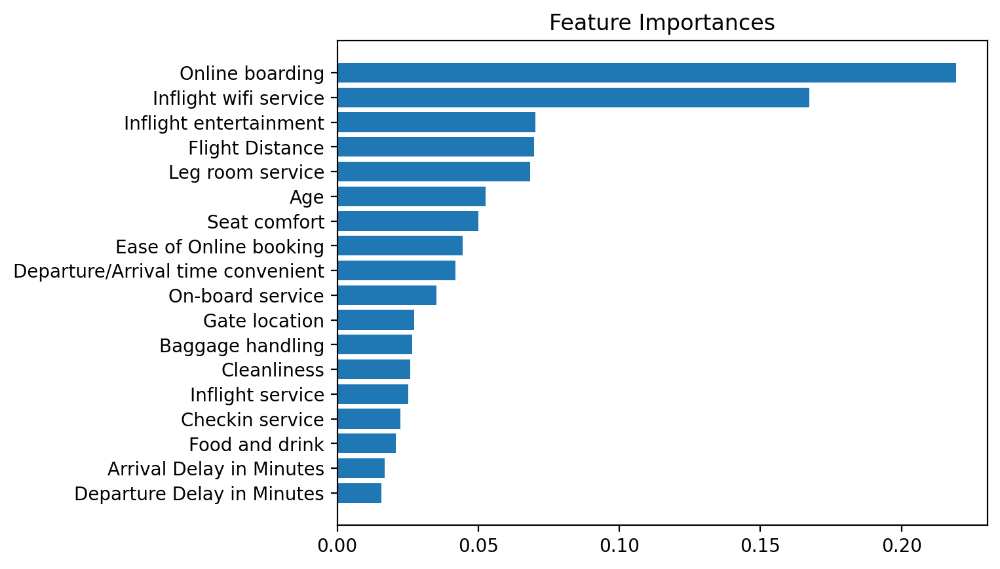

In [41]:
fig, ax = plt.subplots()
feature_importances = grid_search.best_estimator_.named_steps["estimator"].feature_importances_
sort_idx = np.argsort(feature_importances)
sorted_features = [features[idx] for idx in sort_idx]
ax.barh(sorted_features, feature_importances[sort_idx])
ax.set_title("Feature Importances")
None